In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
!pip install category_encoders
from category_encoders import TargetEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from scipy.stats import boxcox
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import warnings

In [14]:
# Plotting Functions

def plot_feature(feat,t=''):
    figure,ax = plt.subplots(1,2,figsize=(12,5))
    sns.set_palette("muted")
    sns.histplot(x=df[feat],ax=ax[0],fill=False,stat='density')
    sns.kdeplot(x=df[feat],ax=ax[0],fill=True).set_title('{} {} - Distribution'.format(t,feat),fontweight='bold')
    sns.boxplot(x=df[feat],ax=ax[1]).set_title('{} {} - Outlier Detection'.format(t,feat),fontweight='bold')

def plot_feature_1(feat,t=''):
    figure,ax = plt.subplots(1,3,figsize=(17,6))
    sns.set_palette("muted")
    sns.histplot(x=df[feat],ax=ax[0],fill=False,stat='density')
    sns.kdeplot(x=df[feat],ax=ax[0],fill=True).set_title('{} {} - Distribution'.format(t,feat),fontweight='bold')
    sns.boxplot(x=df[feat],ax=ax[1]).set_title('{} {} - Outlier Detection'.format(t,feat),fontweight='bold')
    sns.stripplot(x='Loan Status', y=feat, data=df_original, ax=ax[2],jitter=True, hue='Loan Status', dodge=False, palette='viridis').set_title('{} {} vs Loan Status (Target)'.format(t,feat),fontweight='bold')
    plt.legend(title='Loan Status', loc = 'upper center',labels=['Active','Default'])

def plot_feature_discrete(feat):
    figure,ax = plt.subplots(1,2,figsize=(12,5))
    sns.set_palette("muted")
    sns.countplot(x=df[feat],ax=ax[0]).set_title('{} - Distribution'.format(feat),fontweight='bold')
    #sns.kdeplot(x=df[feat],ax=ax[0],fill=True)
    sns.boxplot(x=df[feat],ax=ax[1]).set_title('{} - Outlier Detection'.format(feat),fontweight='bold')

def plot_feature_categorical(feat):
    figure,ax = plt.subplots(figsize=(12,5))
    sns.set_palette("muted")
    sns.countplot(y=df[feat],ax=ax[0]).set_title('{} - Distribution'.format(feat),fontweight='bold')
    #sns.kdeplot(x=df[feat],ax=ax[0],fill=True)
    #sns.boxplot(x=df[feat],ax=ax[1]).set_title('{} - Outlier Detection'.format(feat),fontweight='bold')

In [15]:
!wget --header="Host: doc-0s-8o-docs.googleusercontent.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/97.0.4692.99 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header="Cookie: AUTH_s598521d0impsan3vo6pupi0p4566tqa_nonce=pm4u0gqtal6ea" --header="Connection: keep-alive" "https://doc-0s-8o-docs.googleusercontent.com/docs/securesc/r8h4g7en6l1abk9s80k4b8euia9g4d5g/i6e1eql0ch2iaghn0blop0hfbbhj0nqf/1644145500000/10125335727163690884/10125335727163690884/1FIqp06eYOgGWMXJ9dScHi30McwIYXSCV?e=download&authuser=1&nonce=pm4u0gqtal6ea&user=10125335727163690884&hash=1k4e7v0l43g8amo1edubsrimdvihr0mf" -c -O 'train.csv'

--2022-02-06 11:07:04--  https://doc-0s-8o-docs.googleusercontent.com/docs/securesc/r8h4g7en6l1abk9s80k4b8euia9g4d5g/i6e1eql0ch2iaghn0blop0hfbbhj0nqf/1644145500000/10125335727163690884/10125335727163690884/1FIqp06eYOgGWMXJ9dScHi30McwIYXSCV?e=download&authuser=1&nonce=pm4u0gqtal6ea&user=10125335727163690884&hash=1k4e7v0l43g8amo1edubsrimdvihr0mf
Resolving doc-0s-8o-docs.googleusercontent.com (doc-0s-8o-docs.googleusercontent.com)... 74.125.133.132, 2a00:1450:400c:c07::84
Connecting to doc-0s-8o-docs.googleusercontent.com (doc-0s-8o-docs.googleusercontent.com)|74.125.133.132|:443... connected.
HTTP request sent, awaiting response... 416 Requested range not satisfiable

    The file is already fully retrieved; nothing to do.



In [16]:
df_master = pd.read_csv('train.csv')

In [17]:
df_original = pd.read_csv('train.csv')
y = pd.DataFrame(df_original['Loan Status'])
df_original.drop(['Loan Status'],axis=1, inplace=True)
df,X_test,df_y,y_test = train_test_split(df_original,y,stratify = y,test_size = 0.1, random_state =42)
df.shape

(60716, 34)

In [18]:
pd.set_option('display.max_columns', None)
df.head()

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit
19303,45923819,21497,8173,9554.691683,58,BAT4271519,9.740657,A,E3,MORTGAGE,76342.61579,Not Verified,n,Credit card refinancing,14.922408,0,0,9,0,7125,83.972847,4,f,1583.203195,0.040111,9.267102,0.285043,0,INDIVIDUAL,24,0,24,36767,25499
18659,2075401,15123,7324,9425.109627,59,BAT2833642,14.184352,F,B1,MORTGAGE,81509.43143,Verified,n,Credit card refinancing,26.059738,0,0,14,0,5372,24.065929,6,w,2315.875456,0.056947,0.816614,0.184698,0,INDIVIDUAL,76,0,38,484060,32916
228,22688037,16630,6766,21229.668480,59,BAT5849876,23.107420,B,B1,RENT,102279.09580,Source Verified,n,Debt consolidation,22.673639,0,0,8,0,5354,40.448391,26,f,2487.970446,0.090822,6.245826,0.233682,0,INDIVIDUAL,90,0,11,166714,4425
42018,34809188,12786,13956,13405.624740,59,BAT2428731,6.020719,D,B5,OWN,83827.69494,Source Verified,n,Home improvement,15.774540,0,0,18,0,6032,21.386740,13,f,1349.989946,0.067904,5.857775,1.198719,0,INDIVIDUAL,91,0,39,328409,2689
10207,50360069,17770,12167,4998.892707,59,BAT1780517,11.210783,A,B1,MORTGAGE,120520.07910,Source Verified,n,Debt consolidation,14.210585,0,0,10,0,15658,83.654772,7,w,1209.542038,0.023024,4.315324,1.502794,0,INDIVIDUAL,67,0,29,81694,25730


## **Target Variable - Loan Status**

It is a highly imbalanced dataset

Text(0.5, 1.0, 'Target Variable')

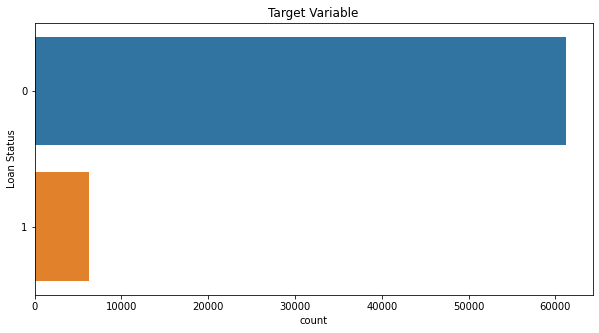

In [19]:
plt.figure(figsize =(10,5))
sns.countplot(data=y,y='Loan Status').set_title("Target Variable")

## **Missing Values**

No Missing values are seen in the data

In [20]:
# no missing values in the data set
df.isna().any()

ID                              False
Loan Amount                     False
Funded Amount                   False
Funded Amount Investor          False
Term                            False
Batch Enrolled                  False
Interest Rate                   False
Grade                           False
Sub Grade                       False
Employment Duration             False
Home Ownership                  False
Verification Status             False
Payment Plan                    False
Loan Title                      False
Debit to Income                 False
Delinquency - two years         False
Inquires - six months           False
Open Account                    False
Public Record                   False
Revolving Balance               False
Revolving Utilities             False
Total Accounts                  False
Initial List Status             False
Total Received Interest         False
Total Received Late Fee         False
Recoveries                      False
Collection R

## **Numerical Features**

In [21]:
df_num = df.select_dtypes(include=['float64','int64'])
df_num.head()

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Home Ownership,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit
19303,45923819,21497,8173,9554.691683,58,9.740657,76342.61579,14.922408,0,0,9,0,7125,83.972847,4,1583.203195,0.040111,9.267102,0.285043,0,24,0,24,36767,25499
18659,2075401,15123,7324,9425.109627,59,14.184352,81509.43143,26.059738,0,0,14,0,5372,24.065929,6,2315.875456,0.056947,0.816614,0.184698,0,76,0,38,484060,32916
228,22688037,16630,6766,21229.668480,59,23.107420,102279.09580,22.673639,0,0,8,0,5354,40.448391,26,2487.970446,0.090822,6.245826,0.233682,0,90,0,11,166714,4425
42018,34809188,12786,13956,13405.624740,59,6.020719,83827.69494,15.774540,0,0,18,0,6032,21.386740,13,1349.989946,0.067904,5.857775,1.198719,0,91,0,39,328409,2689
10207,50360069,17770,12167,4998.892707,59,11.210783,120520.07910,14.210585,0,0,10,0,15658,83.654772,7,1209.542038,0.023024,4.315324,1.502794,0,67,0,29,81694,25730


## **Numerical Features - Distributions of each feature**

### **1. Loan Amount**

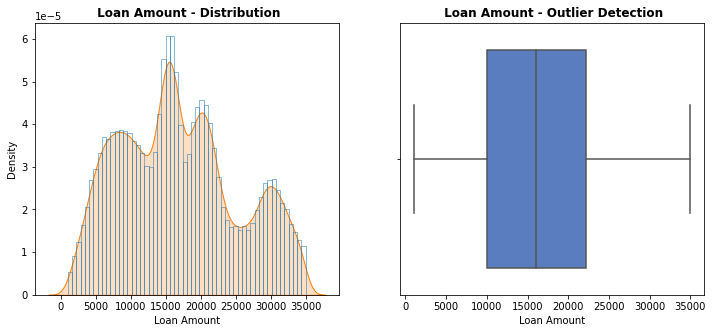

In [22]:
plot_feature('Loan Amount')

### **2. Funded Amount**

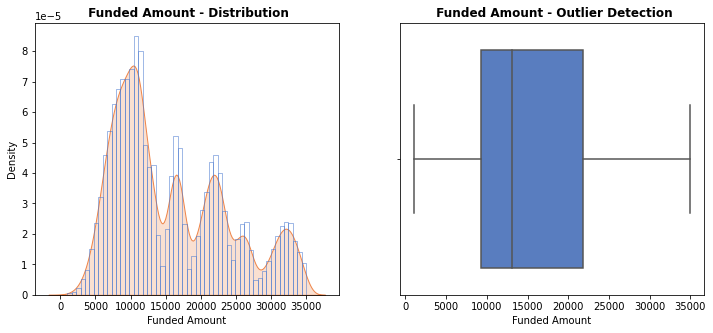

In [23]:
plot_feature('Funded Amount')

### **3. Funded Amount Investor**

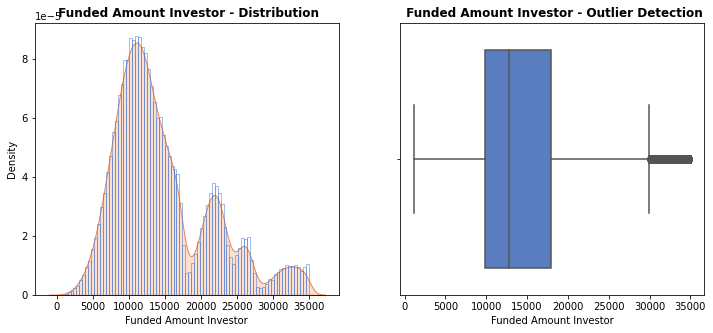

In [24]:
plot_feature('Funded Amount Investor')

### **4. Term**

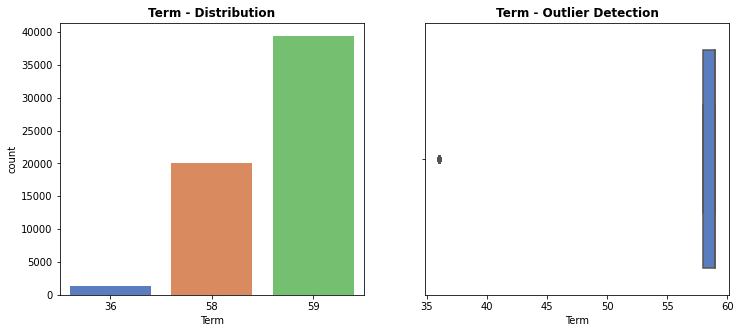

In [25]:
plot_feature_discrete('Term')

### **5. Interest Rate**

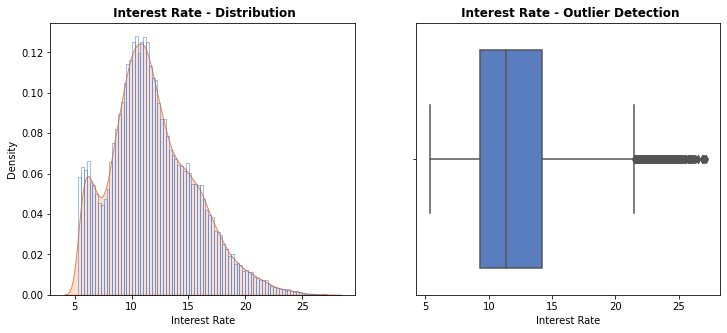

In [26]:
plot_feature('Interest Rate')

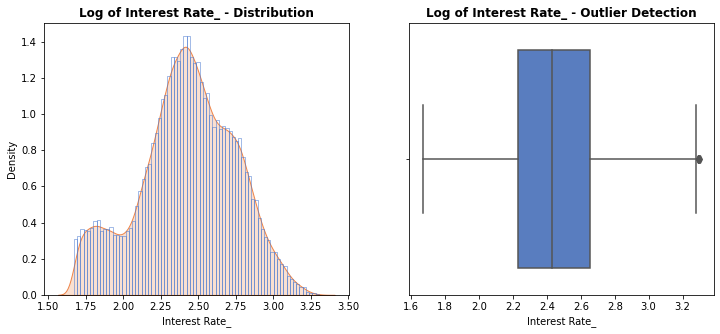

In [27]:
# Logarithmic transformation
df.loc[:,['Interest Rate_']] = np.log(df["Interest Rate"]).tolist()
df.drop(['Interest Rate'],axis=1, inplace=True)
plot_feature('Interest Rate_','Log of')

X_test.loc[:,['Interest Rate_']] = np.log(X_test["Interest Rate"]).tolist()
X_test.drop(['Interest Rate'],axis=1, inplace=True)

### **6. Home Ownership**

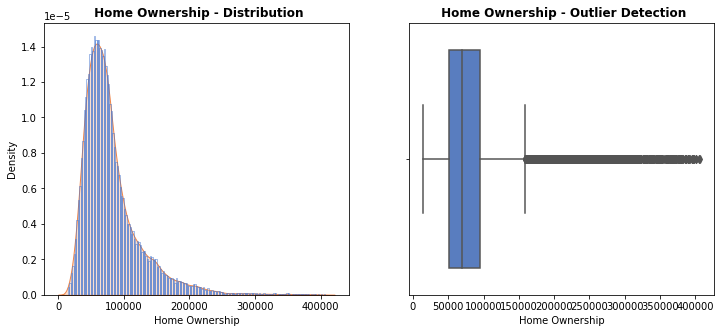

In [28]:
plot_feature('Home Ownership')

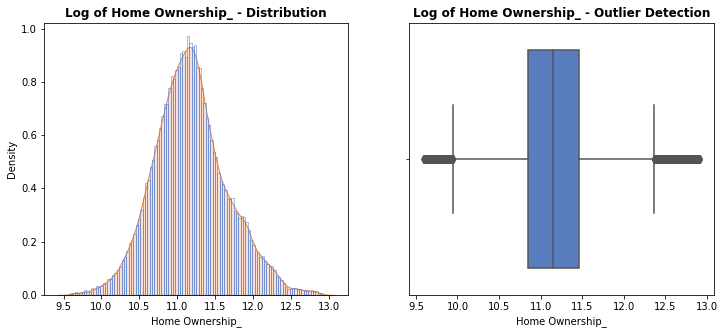

In [29]:
df.loc[:,['Home Ownership_']] = (np.log(df["Home Ownership"])).tolist()
df.drop(['Home Ownership'],axis=1, inplace=True)
plot_feature('Home Ownership_','Log of')

X_test.loc[:,['Home Ownership_']] = (np.log(X_test["Home Ownership"])).tolist()
X_test.drop(['Home Ownership'],axis=1, inplace=True)

### **7. Debit to Income**

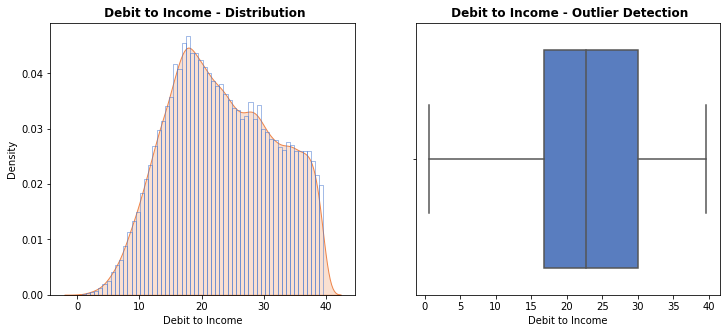

In [30]:
plot_feature('Debit to Income')

### **8. Delinquency - two years**

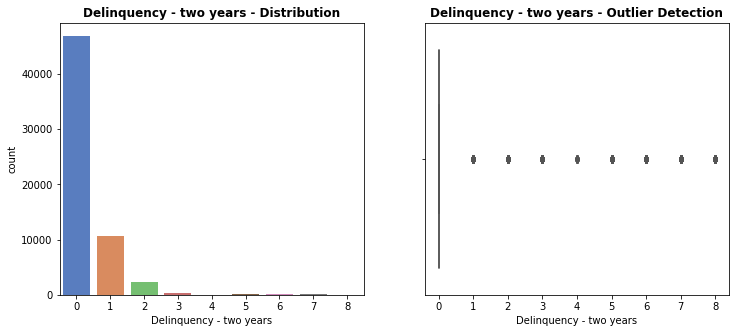

In [31]:
plot_feature_discrete('Delinquency - two years')

### **8. Inquires - six months**

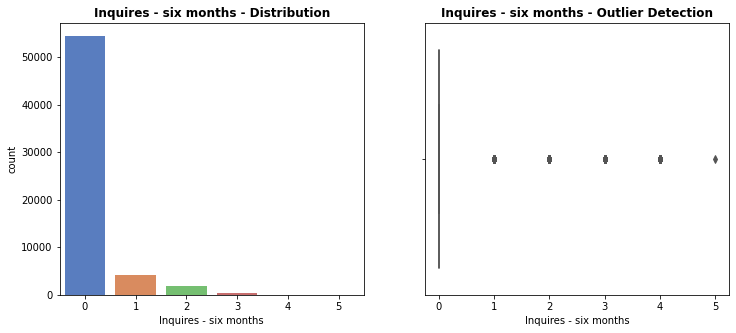

In [32]:
plot_feature_discrete('Inquires - six months')

### **9. Open Account**

Text(0.5, 1.0, 'Open Account - Outlier Detection')

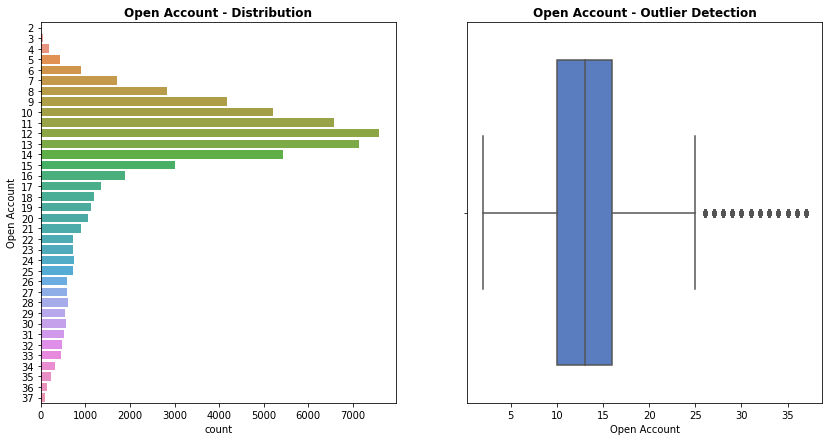

In [33]:
figure,ax = plt.subplots(1,2,figsize=(14,7))
sns.set_palette("muted")
sns.countplot(y=df['Open Account'],ax=ax[0]).set_title('{} - Distribution'.format('Open Account'),fontweight='bold')
#sns.kdeplot(x=df[feat],ax=ax[0],fill=True)
sns.boxplot(x=df['Open Account'],ax=ax[1]).set_title('{} - Outlier Detection'.format('Open Account'),fontweight='bold')

### **10. Public Record**

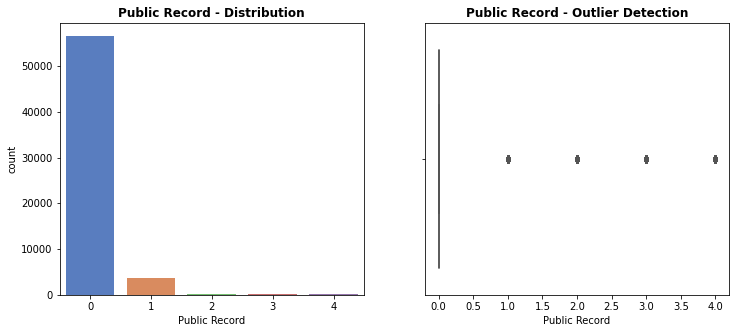

In [34]:
plot_feature_discrete('Public Record')

### **11. Revolving Balance**

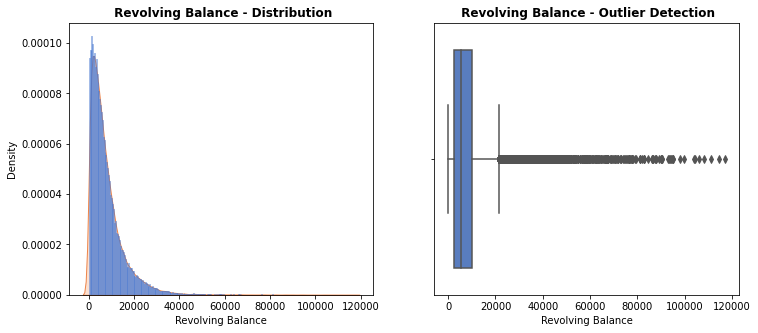

In [35]:
plot_feature('Revolving Balance')

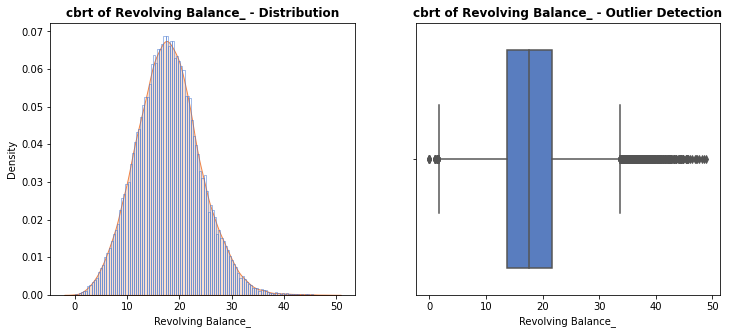

In [36]:
df.loc[:,['Revolving Balance_']] = (np.cbrt(df["Revolving Balance"])).tolist()
df.drop(['Revolving Balance'],axis=1, inplace=True)
plot_feature('Revolving Balance_','cbrt of')

X_test.loc[:,['Revolving Balance_']] = (np.cbrt(X_test["Revolving Balance"])).tolist()
X_test.drop(['Revolving Balance'],axis=1, inplace=True)

### **12. Revolving Utilities**

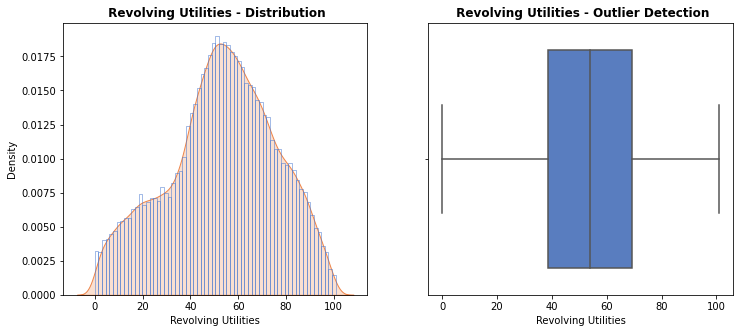

In [37]:
plot_feature('Revolving Utilities')

### **13. Total Accounts**


Text(0.5, 1.0, 'Total Accounts - Outlier Detection')

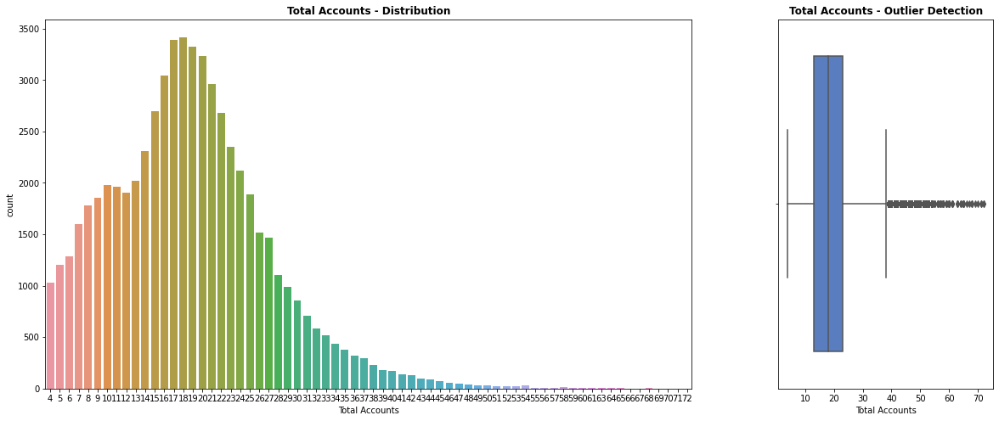

In [38]:
from matplotlib import gridspec
figure,ax = plt.subplots(1,2,figsize=(20,8),gridspec_kw={'width_ratios': [3, 1]})
sns.set_palette("muted")
sns.countplot(x=df['Total Accounts'],ax=ax[0]).set_title('{} - Distribution'.format('Total Accounts'),fontweight='bold')
#sns.kdeplot(x=df[feat],ax=ax[0],fill=True)
sns.boxplot(x=df['Total Accounts'],ax=ax[1]).set_title('{} - Outlier Detection'.format('Total Accounts'),fontweight='bold')

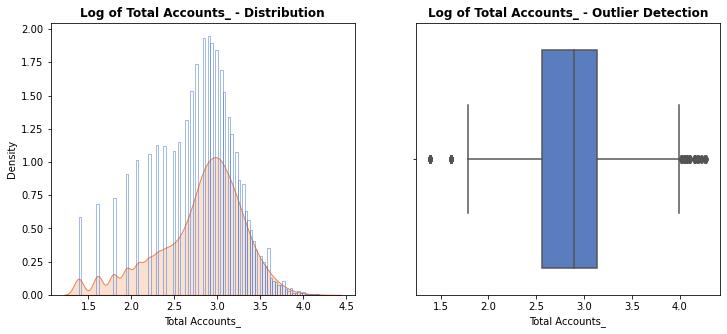

In [39]:
df.loc[:,['Total Accounts_']] = (np.log(df["Total Accounts"])).tolist()
df.drop(['Total Accounts'],axis=1, inplace=True)
plot_feature('Total Accounts_','Log of')

X_test.loc[:,['Total Accounts_']] = (np.log(X_test["Total Accounts"])).tolist()
X_test.drop(['Total Accounts'],axis=1, inplace=True)

### **14. Total Received Interest**


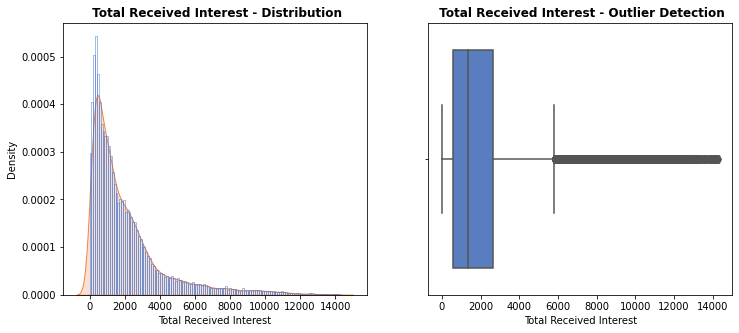

In [40]:
plot_feature('Total Received Interest')

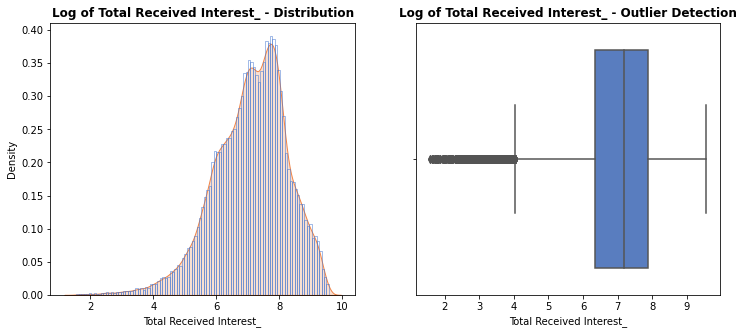

In [41]:
df.loc[:,['Total Received Interest_']] = (np.log(df['Total Received Interest'])).tolist()
df.drop(['Total Received Interest'],axis=1, inplace=True)
plot_feature('Total Received Interest_','Log of')

X_test.loc[:,['Total Received Interest_']] = (np.log(X_test['Total Received Interest'])).tolist()
X_test.drop(['Total Received Interest'],axis=1, inplace=True)

### **15. Total Received Late Fee**

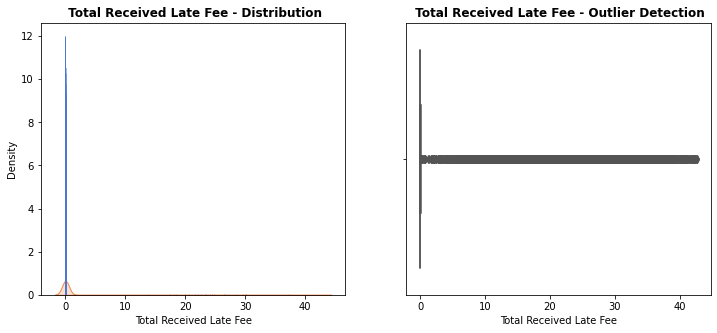

In [42]:
plot_feature('Total Received Late Fee')

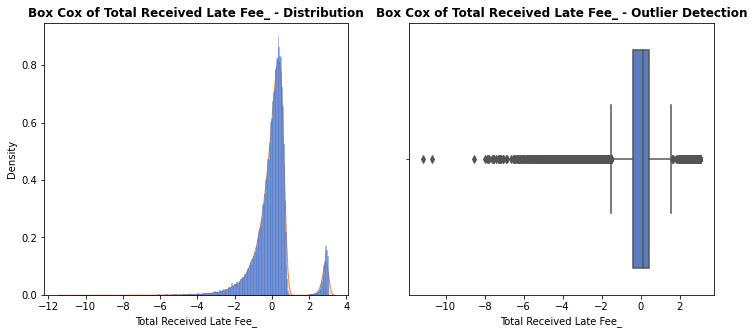

In [43]:
pt = PowerTransformer(method = 'box-cox')
df.loc[:,['Total Received Late Fee_']] = (pt.fit_transform(np.array(df['Total Received Late Fee']).reshape(-1,1))).tolist()
plot_feature('Total Received Late Fee_','Box Cox of')

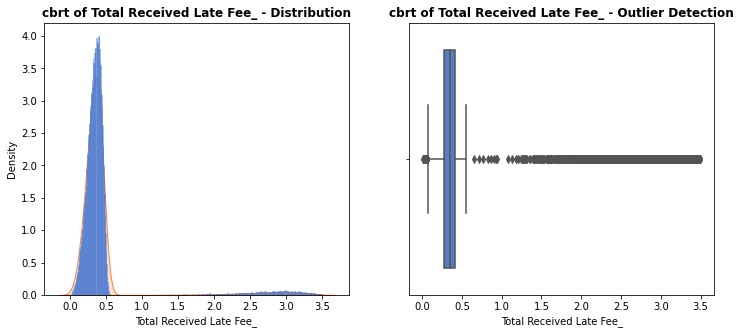

In [44]:
df.loc[:,['Total Received Late Fee_']] = (np.cbrt(df['Total Received Late Fee'])).tolist()
df.drop(["Total Received Late Fee"],axis=1, inplace=True)
plot_feature('Total Received Late Fee_','cbrt of')

X_test.loc[:,['Total Received Late Fee_']] = (np.cbrt(X_test['Total Received Late Fee'])).tolist()
X_test.drop(["Total Received Late Fee"],axis=1, inplace=True)

Cube Root works better than box cox for this feature

### **16. Recoveries**

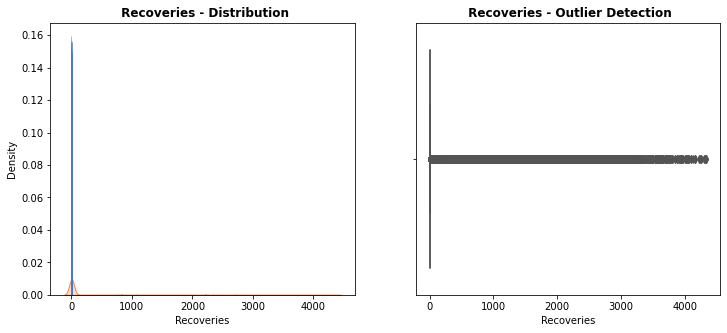

In [45]:
plot_feature('Recoveries')

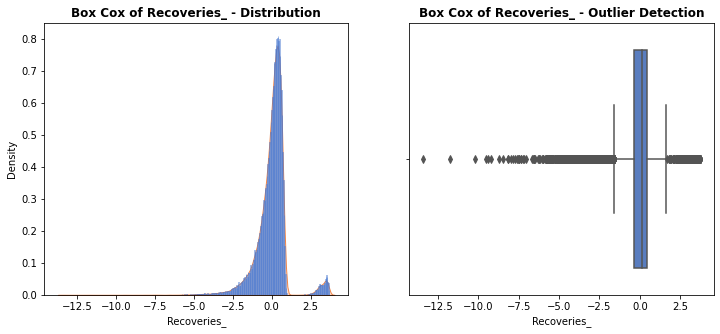

In [46]:
pt = PowerTransformer(method = 'box-cox')
df.loc[:,['Recoveries_']] = (pt.fit_transform(np.array(df['Recoveries']).reshape(-1,1))).tolist()
plot_feature('Recoveries_','Box Cox of')

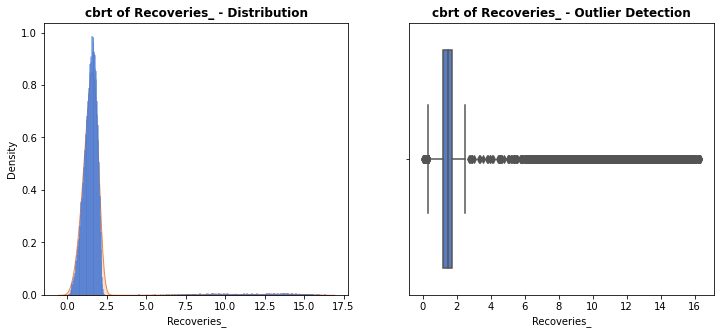

In [47]:
df.loc[:,['Recoveries_']] = (np.cbrt(df['Recoveries'])).tolist()
df.drop(['Recoveries'],axis=1, inplace=True)
plot_feature('Recoveries_','cbrt of')

X_test.loc[:,['Recoveries_']] = (np.cbrt(X_test['Recoveries'])).tolist()
X_test.drop(['Recoveries'],axis=1, inplace=True)

Cube Root works better than Box Cox transform this feature

### **17. Collection Recovery Fee**

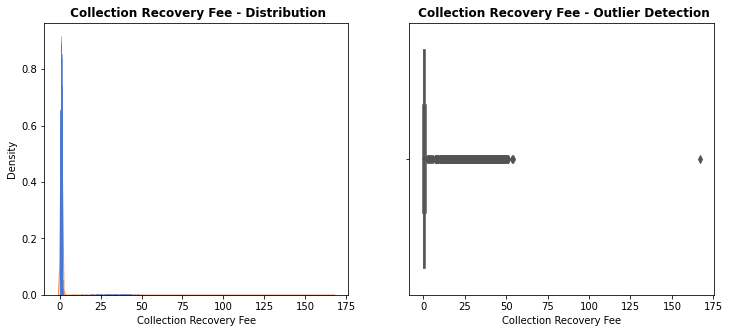

In [48]:
plot_feature('Collection Recovery Fee')

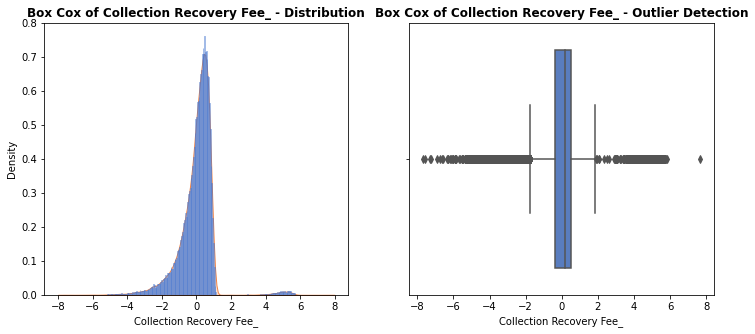

In [49]:
pt = PowerTransformer(method = 'box-cox')
df.loc[:,['Collection Recovery Fee_']] = (pt.fit_transform(np.array(df['Collection Recovery Fee']).reshape(-1,1))).tolist()
plot_feature('Collection Recovery Fee_','Box Cox of')

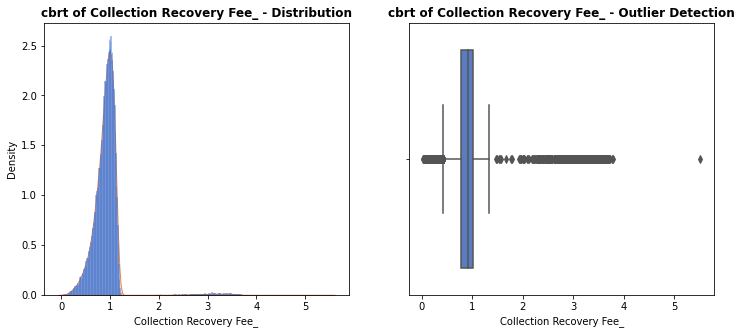

In [50]:
df.loc[:,['Collection Recovery Fee_']] = (np.cbrt(df['Collection Recovery Fee'])).tolist()
#df.drop(['Recoveries'],axis=1, inplace=True)
plot_feature('Collection Recovery Fee_','cbrt of')

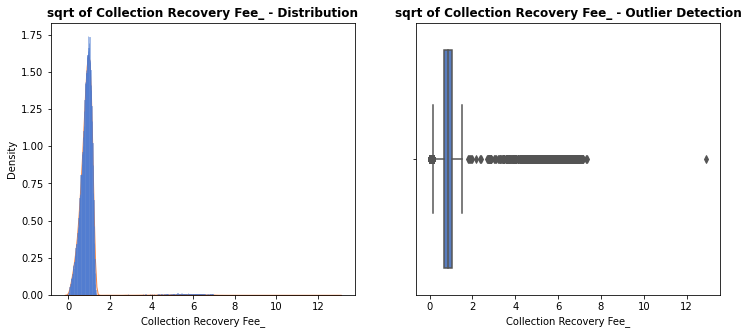

In [51]:
df.loc[:,['Collection Recovery Fee_']] = (np.sqrt(df['Collection Recovery Fee'])).tolist()
df.drop(['Collection Recovery Fee'],axis=1, inplace=True)
plot_feature('Collection Recovery Fee_','sqrt of')

X_test.loc[:,['Collection Recovery Fee_']] = (np.sqrt(X_test['Collection Recovery Fee'])).tolist()
X_test.drop(['Collection Recovery Fee'],axis=1, inplace=True)

Square Root works better than Box Cox and Cube Root for this feature

### **18. Last week Pay**

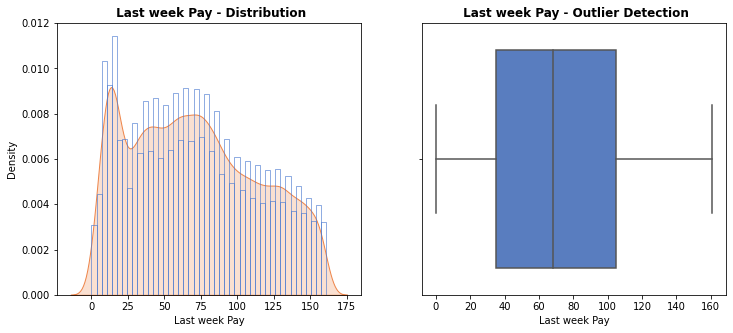

In [52]:
plot_feature('Last week Pay')

### **19. Accounts Delinquent**

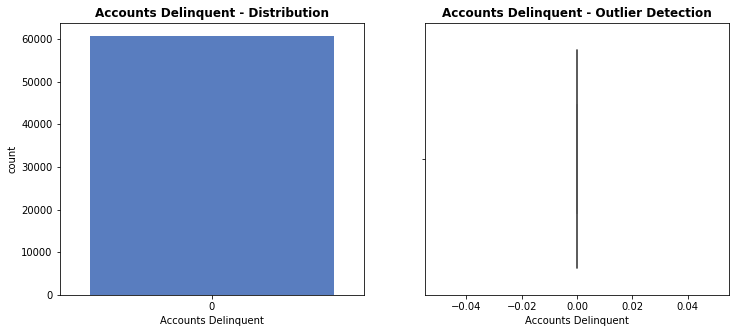

In [53]:
plot_feature_discrete('Accounts Delinquent')

In [54]:
# drop the column
df.drop(['Accounts Delinquent'],axis=1, inplace=True)
X_test.drop(['Accounts Delinquent'],axis=1, inplace=True)

### **20. Total Collection Amount**

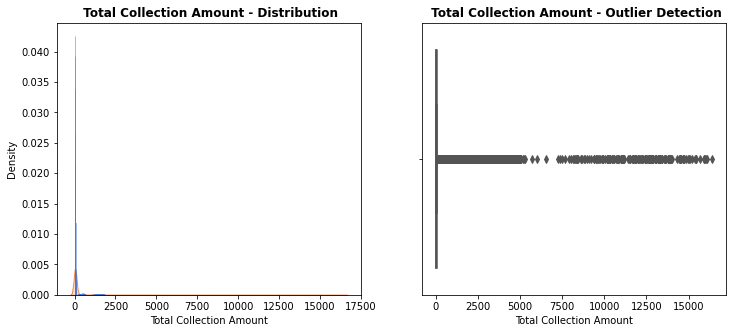

In [55]:
plot_feature("Total Collection Amount")

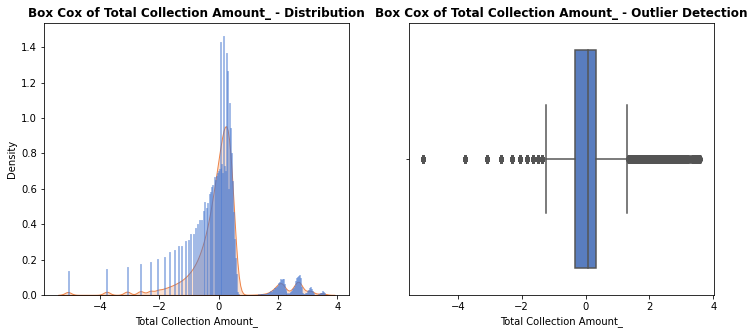

In [56]:
pt = PowerTransformer(method = 'box-cox')
df.loc[:,["Total Collection Amount_"]] = (pt.fit_transform(np.array(df["Total Collection Amount"]).reshape(-1,1))).tolist()
plot_feature("Total Collection Amount_",'Box Cox of')

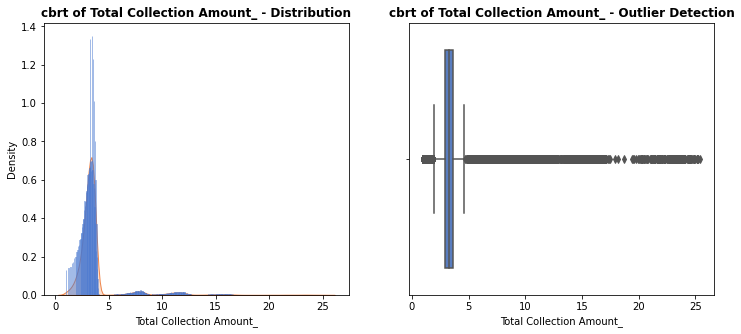

In [57]:
df.loc[:,["Total Collection Amount_"]] = (np.cbrt(df["Total Collection Amount"])).tolist()
df.drop(["Total Collection Amount"],axis=1, inplace=True)
plot_feature("Total Collection Amount_",'cbrt of')

X_test.loc[:,["Total Collection Amount_"]] = (np.cbrt(X_test["Total Collection Amount"])).tolist()
X_test.drop(["Total Collection Amount"],axis=1, inplace=True)

We choose cbrt transform and not Box Cox here, as it is the closest to a Gaussian Normal

### **21. Total Current Balance**

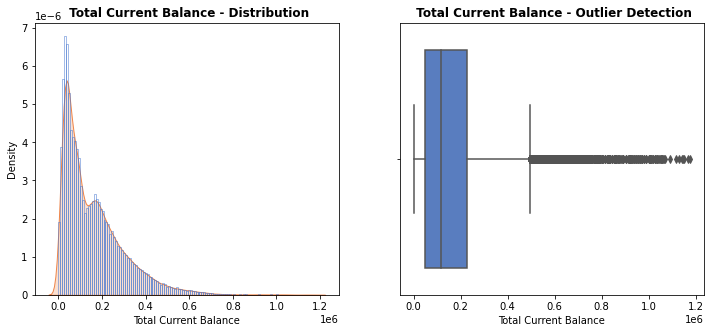

In [58]:
plot_feature('Total Current Balance')

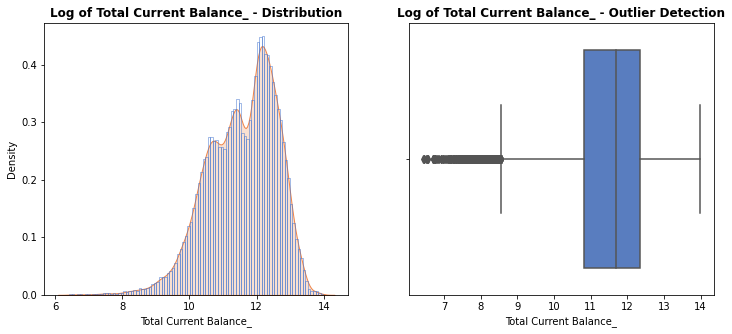

In [59]:
df.loc[:,['Total Current Balance_']] = (np.log(df['Total Current Balance'])).tolist()
df.drop(['Total Current Balance'],axis=1, inplace=True)
plot_feature('Total Current Balance_','Log of')

X_test.loc[:,['Total Current Balance_']] = (np.log(X_test['Total Current Balance'])).tolist()
X_test.drop(['Total Current Balance'],axis=1, inplace=True)

### **22. Total Revolving Credit Limit**

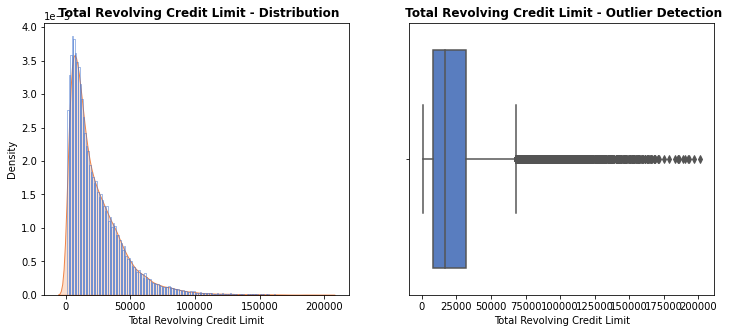

In [60]:
plot_feature('Total Revolving Credit Limit')

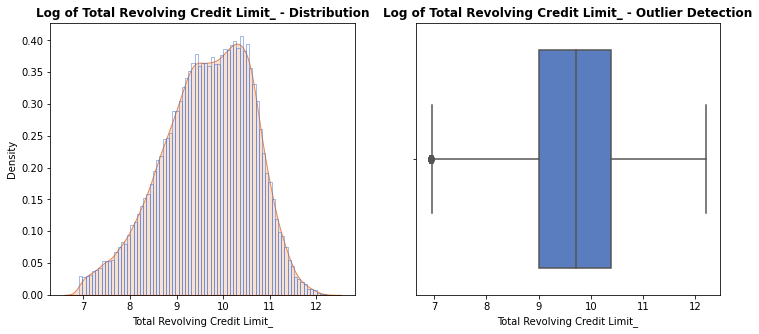

In [61]:
df.loc[:,['Total Revolving Credit Limit_']] = (np.log(df['Total Revolving Credit Limit'])).tolist()
df.drop(['Total Revolving Credit Limit'],axis=1, inplace=True)
plot_feature('Total Revolving Credit Limit_','Log of')

X_test.loc[:,['Total Revolving Credit Limit_']] = (np.log(X_test['Total Revolving Credit Limit'])).tolist()
X_test.drop(['Total Revolving Credit Limit'],axis=1, inplace=True)

## ***************** IGNORE ***********************************

## **A combined plot of all Numerical Feature Distributions**

warnings.filterwarnings('ignore', category = UserWarning)
col_list = df_num.columns
fig, axes = plt.subplots(5, 5, figsize=(22, 30))
sns.kdeplot(data=df_num,x=col_list[1], color='red', fill=True, ax= axes[0,0])
sns.kdeplot(data=df_num,x=col_list[2], color='blue', fill=True, ax= axes[0,1])
sns.kdeplot(data=df_num,x=col_list[3], color='green', fill=True, ax= axes[0,2])
sns.kdeplot(data=df_num,x=col_list[4], color='orange', fill=True, ax= axes[0,3])
sns.kdeplot(data=df_num,x=col_list[5], color='purple', fill=True, ax= axes[0,4])
sns.kdeplot(data=df_num,x=col_list[6], color='sienna', fill=True, ax= axes[1,0])
sns.kdeplot(data=df_num,x=col_list[7], color='plum', fill=True, ax= axes[1,1])
sns.kdeplot(data=df_num,x=col_list[8], color='coral', fill=True, ax= axes[1,2])
sns.kdeplot(data=df_num,x=col_list[9], color='yellow', fill=True, ax= axes[1,3])
sns.kdeplot(data=df_num,x=col_list[10], color='lightpink', fill=True, ax= axes[1,4])
sns.kdeplot(data=df_num,x=col_list[11], color='orchid', fill=True, ax= axes[2,0])
sns.kdeplot(data=df_num,x=col_list[12], color='crimson', fill=True, ax= axes[2,1])
sns.kdeplot(data=df_num,x=col_list[13], color='violet', fill=True, ax= axes[2,2])
sns.kdeplot(data=df_num,x=col_list[14], color='lightgreen', fill=True, ax= axes[2,3])
sns.kdeplot(data=df_num,x=col_list[15], color='khaki', fill=True, ax= axes[2,4])
sns.kdeplot(data=df_num,x=col_list[16], color='magenta', fill=True, ax= axes[3,0])
sns.kdeplot(data=df_num,x=col_list[17], color='seagreen', fill=True, ax= axes[3,1])
sns.kdeplot(data=df_num,x=col_list[18], color='red', fill=True, ax= axes[3,2])
sns.kdeplot(data=df_num,x=col_list[19], color='blue', fill=True, ax= axes[3,3])
sns.kdeplot(data=df_num,x=col_list[20], color='wheat', fill=True, ax= axes[3,4])
sns.kdeplot(data=df_num,x=col_list[21], color='purple', fill=True, ax= axes[4,0])
sns.kdeplot(data=df_num,x=col_list[22], color='orange', fill=True, ax= axes[4,1])
sns.kdeplot(data=df_num,x=col_list[23], color='peru', fill=True, ax= axes[4,2])
sns.kdeplot(data=df_num,x=col_list[24], color='blueviolet', fill=True, ax= axes[4,3])
sns.kdeplot(data=df_num,x=col_list[25], color='plum', fill=True, ax= axes[4,4])


### Distribution of numerical features wrt Output

warnings.filterwarnings('ignore', category = UserWarning)
col_list = df_num.columns
fig, axes = plt.subplots(5, 5, figsize=(22, 30))
sns.kdeplot(data=df_num,x=col_list[1], color='red', fill=True, ax= axes[0,0],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[2], color='blue', fill=True, ax= axes[0,1],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[3], color='green', fill=True, ax= axes[0,2],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[4], color='orange', fill=True, ax= axes[0,3],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[5], color='purple', fill=True, ax= axes[0,4],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[6], color='sienna', fill=True, ax= axes[1,0],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[7], color='plum', fill=True, ax= axes[1,1],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[8], color='coral', fill=True, ax= axes[1,2],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[9], color='yellow', fill=True, ax= axes[1,3],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[10], color='lightpink', fill=True, ax= axes[1,4],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[11], color='orchid', fill=True, ax= axes[2,0],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[12], color='crimson', fill=True, ax= axes[2,1],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[13], color='violet', fill=True, ax= axes[2,2],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[14], color='lightgreen', fill=True, ax= axes[2,3],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[15], color='khaki', fill=True, ax= axes[2,4],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[16], color='magenta', fill=True, ax= axes[3,0],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[17], color='seagreen', fill=True, ax= axes[3,1],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[18], color='red', fill=True, ax= axes[3,2],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[19], color='blue', fill=True, ax= axes[3,3],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[20], color='wheat', fill=True, ax= axes[3,4],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[21], color='purple', fill=True, ax= axes[4,0],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[22], color='orange', fill=True, ax= axes[4,1],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[23], color='peru', fill=True, ax= axes[4,2],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[24], color='blueviolet', fill=True, ax= axes[4,3],hue='Loan Status')
sns.kdeplot(data=df_num,x=col_list[25], color='plum', fill=True, ax= axes[4,4],hue='Loan Status')


### From above, we see that in almost all numerical features, there is a significant overlap b/w both categories. So, we cannot conclude much about feature importance.

## ************************************************IGNORE ************************************************

## **Categorical Variables**


In [62]:
df_cat = df.select_dtypes(include=['object'])
df_cat.head(3)

,Batch Enrolled,Grade,Sub Grade,Employment Duration,Verification Status,Payment Plan,Loan Title,Initial List Status,Application Type
19303,BAT4271519,A,E3,MORTGAGE,Not Verified,n,Credit card refinancing,f,INDIVIDUAL
18659,BAT2833642,F,B1,MORTGAGE,Verified,n,Credit card refinancing,w,INDIVIDUAL
228,BAT5849876,B,B1,RENT,Source Verified,n,Debt consolidation,f,INDIVIDUAL


In [63]:
def plot_feature_categorical(feat):
    figure,ax = plt.subplots(figsize=(10,10))
    sns.set_palette("muted")
    sns.countplot(y=df[feat]).set_title('{} - Distribution'.format(feat),fontweight='bold')
    plt.show()
    #sns.kdeplot(x=df[feat],ax=ax[0],fill=True)
    #sns.boxplot(x=df[feat],ax=ax[1]).set_title('{} - Outlier Detection'.format(feat),fontweight='bold')

### **1. Batch Enrolled**

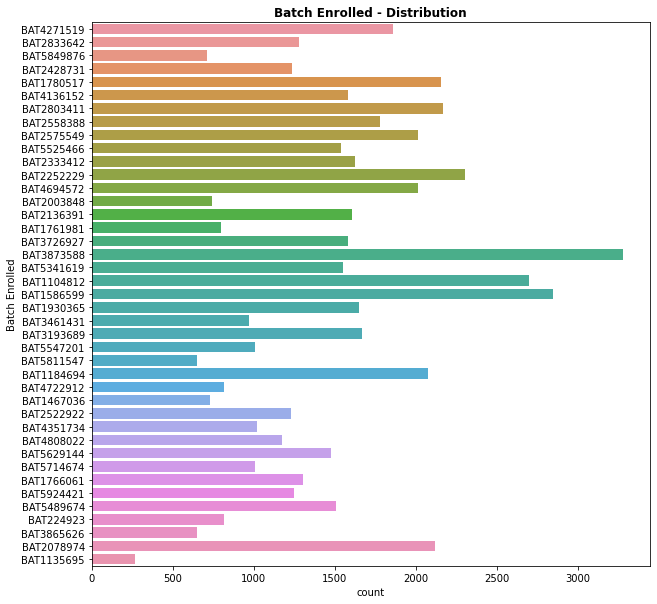

In [64]:
plot_feature_categorical('Batch Enrolled')

In [65]:
'''
# OHE
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(handle_unknown = 'ignore')
column_trans = make_column_transformer((OneHotEncoder(), ['Batch Enrolled', 'Grade', 'Sub Grade', 'Employment Duration',
       'Verification Status', 'Payment Plan', 'Loan Title',
       'Initial List Status', 'Application Type']),
    remainder='passthrough')
df_cat_ohe = pd.DataFrame(column_trans.fit_transform(df_cat))'''

"\n# OHE\nfrom sklearn.compose import make_column_transformer\nfrom sklearn.preprocessing import OneHotEncoder\nohe = OneHotEncoder(handle_unknown = 'ignore')\ncolumn_trans = make_column_transformer((OneHotEncoder(), ['Batch Enrolled', 'Grade', 'Sub Grade', 'Employment Duration',\n       'Verification Status', 'Payment Plan', 'Loan Title',\n       'Initial List Status', 'Application Type']),\n    remainder='passthrough')\ndf_cat_ohe = pd.DataFrame(column_trans.fit_transform(df_cat))"

In [66]:

# Target Encoding with smoothening to avoid overfitting.
#source : https://github.com/jeffheaton/present/blob/master/youtube/target_encoding.ipynb

def calc_smooth_mean(df1, df2, cat_name, target, weight):
    # Compute the global mean
    mean = df_master[target].mean()

    # Compute the number of values and the mean of each group
    agg = df_master.groupby(cat_name)[target].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']

    # Compute the "smoothed" means
    smooth = (counts * means + weight * mean) / (counts + weight)

    # Replace each value by the according smoothed mean
    if df2 is None:
        return df_master[cat_name].map(smooth)
    else:
        return df_master[cat_name].map(smooth),df2[cat_name].map(smooth.to_dict())

In [67]:
X_t = X_test.copy() ; y_t = y_test.copy()
X_t.reset_index(inplace=True) ; y_t.reset_index(inplace=True)

In [68]:
df_testdata = pd.merge(X_t,y_t,how='outer',on='index')

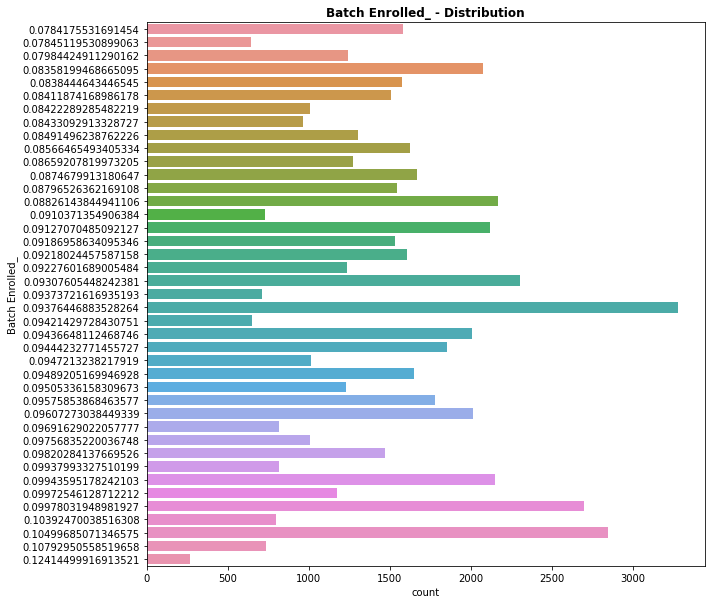

In [69]:
WEIGHT = 8
df.loc[:,['Batch Enrolled_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Batch Enrolled', target='Loan Status', weight=WEIGHT)
plot_feature_categorical('Batch Enrolled_')
df.drop(['Batch Enrolled'],axis=1,inplace=True)


In [70]:
X_test.loc[:,['Batch Enrolled_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Batch Enrolled', target='Loan Status', weight=WEIGHT)
X_test.drop(['Batch Enrolled'],axis=1,inplace=True)

### **2. Grade**

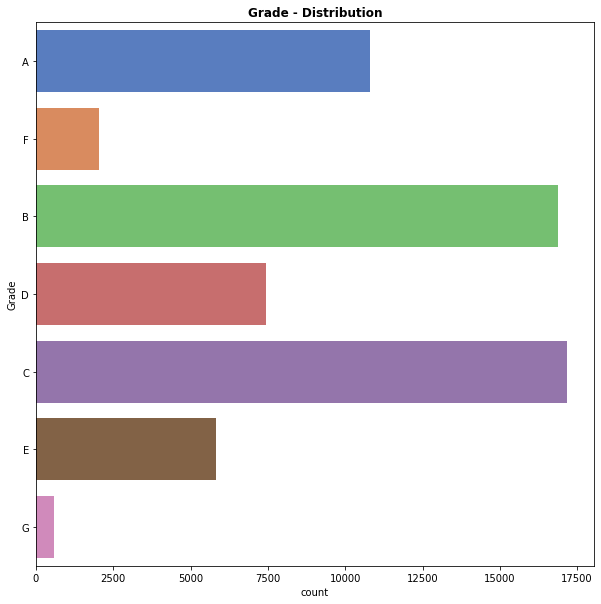

In [71]:
plot_feature_categorical('Grade')

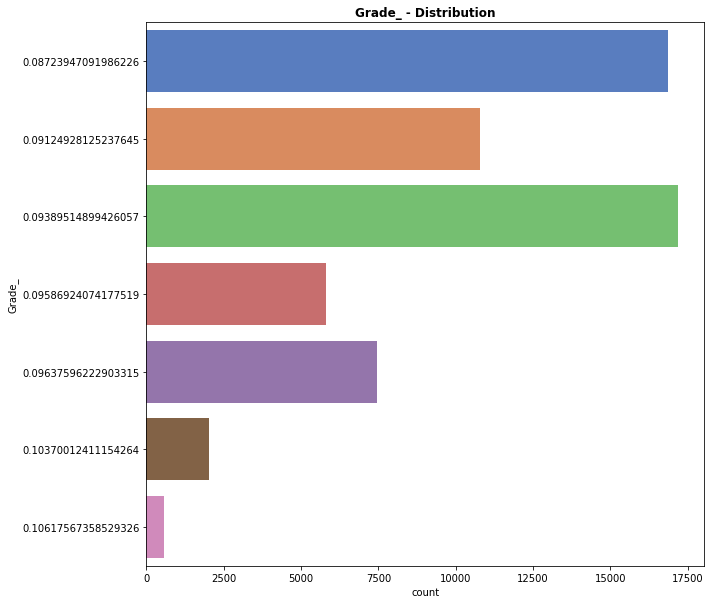

In [72]:
WEIGHT = 8
df.loc[:,['Grade_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Grade', target='Loan Status', weight=WEIGHT)
plot_feature_categorical('Grade_')
df.drop(['Grade'],axis=1,inplace=True)

In [73]:
X_test.loc[:,['Grade_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Grade', target='Loan Status', weight=WEIGHT)
X_test.drop(['Grade'],axis=1,inplace=True)

### **3. Sub Grade**

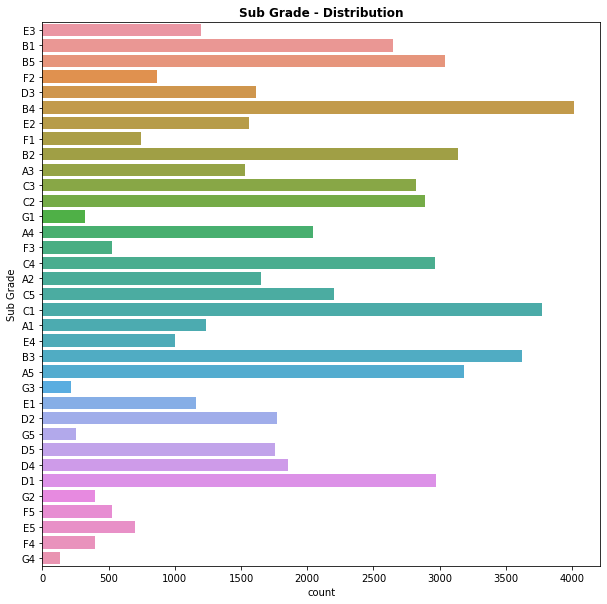

In [74]:
plot_feature_categorical('Sub Grade')

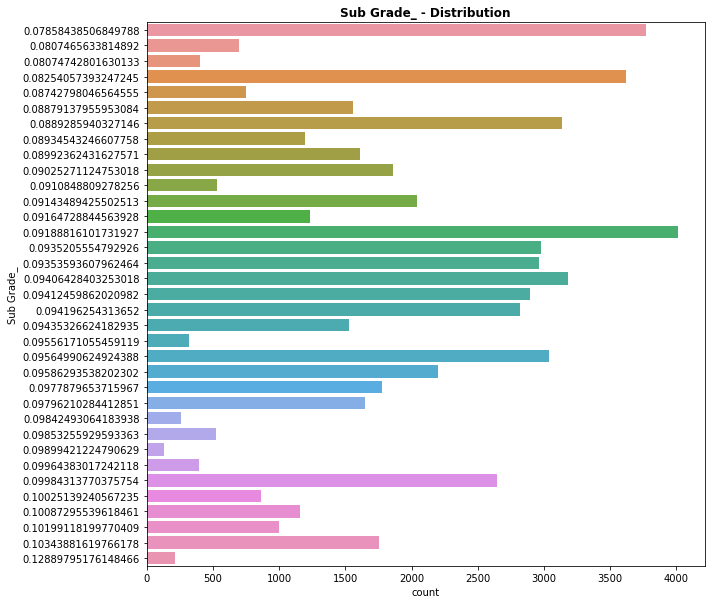

In [75]:
WEIGHT = 8
df.loc[:,['Sub Grade_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Sub Grade', target='Loan Status', weight=WEIGHT)
plot_feature_categorical('Sub Grade_')
df.drop(['Sub Grade'],axis=1,inplace=True)

X_test.loc[:,['Sub Grade_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Sub Grade', target='Loan Status', weight=WEIGHT)
X_test.drop(['Sub Grade'],axis=1,inplace=True)

### **4. Employment Duration**

In [76]:
df.head(2)

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Employment Duration,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Utilities,Initial List Status,Collection 12 months Medical,Application Type,Last week Pay,Interest Rate_,Home Ownership_,Revolving Balance_,Total Accounts_,Total Received Interest_,Total Received Late Fee_,Recoveries_,Collection Recovery Fee_,Total Collection Amount_,Total Current Balance_,Total Revolving Credit Limit_,Batch Enrolled_,Grade_,Sub Grade_
19303,45923819,21497,8173,9554.691683,58,MORTGAGE,Not Verified,n,Credit card refinancing,14.922408,0,0,9,0,83.972847,f,0,INDIVIDUAL,24,2.276309,11.242987,19.242506,1.386294,7.367205,0.34231,2.100461,0.533895,2.884499,10.512356,10.146395,0.094442,0.091249,0.089345
18659,2075401,15123,7324,9425.109627,59,MORTGAGE,Verified,n,Credit card refinancing,26.059738,0,0,14,0,24.065929,w,0,INDIVIDUAL,76,2.652139,11.308474,17.513731,1.791759,7.747543,0.38473,0.934700,0.429765,3.361975,13.089964,10.401714,0.086592,0.103700,0.099843


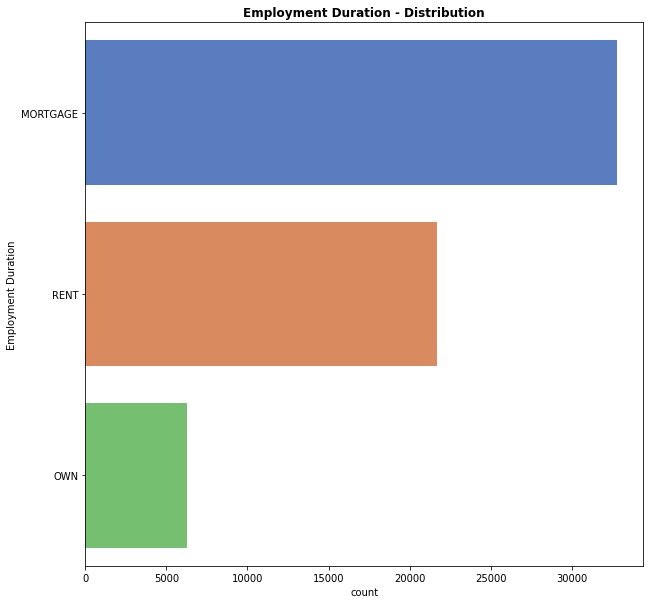

In [77]:
plot_feature_categorical('Employment Duration')

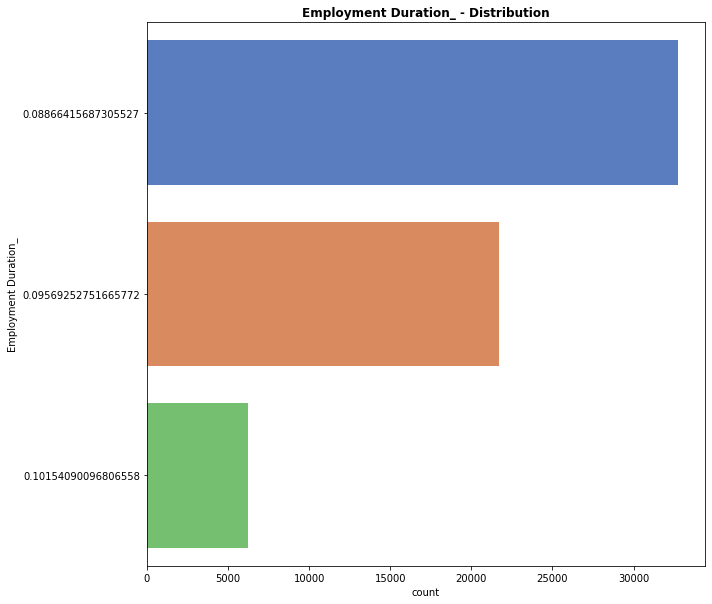

In [78]:
WEIGHT = 8
df.loc[:,['Employment Duration_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Employment Duration', target='Loan Status', weight=WEIGHT)
plot_feature_categorical('Employment Duration_')
df.drop(['Employment Duration'],axis=1,inplace=True)

X_test.loc[:,['Employment Duration_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Employment Duration', target='Loan Status', weight=WEIGHT)
X_test.drop(['Employment Duration'],axis=1,inplace=True)

### **5. Verification Status**

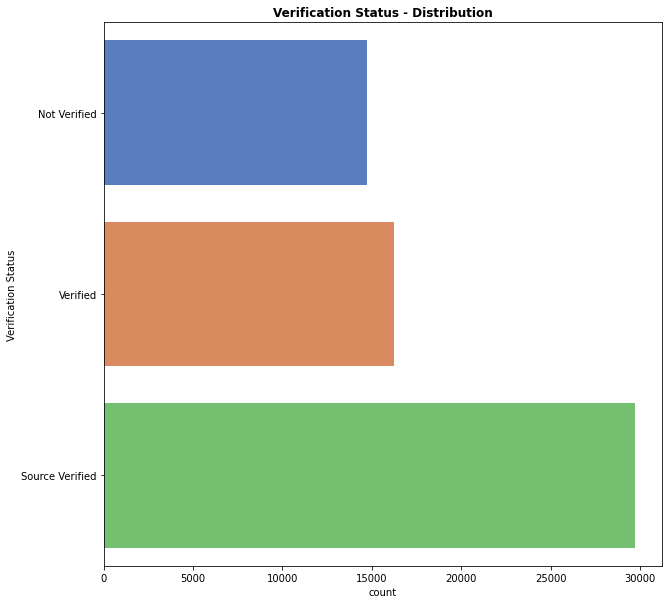

In [79]:
plot_feature_categorical('Verification Status')

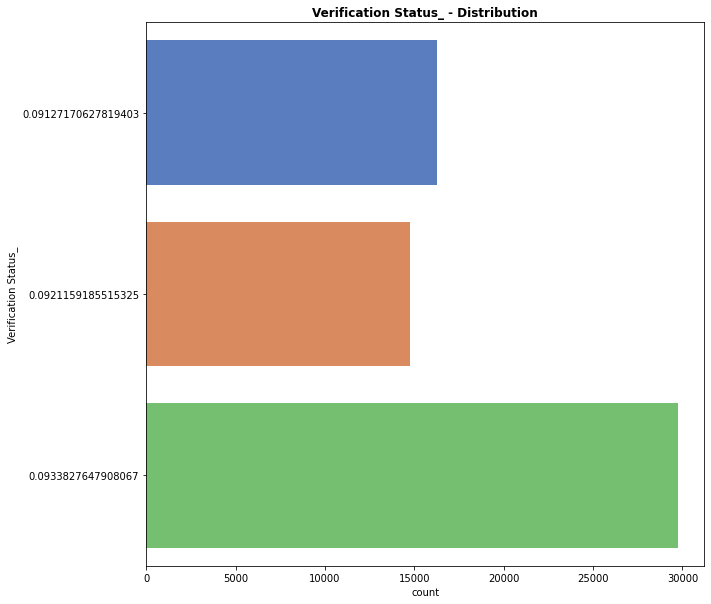

In [80]:
WEIGHT = 8
df.loc[:,['Verification Status_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Verification Status', target='Loan Status', weight=WEIGHT)
plot_feature_categorical('Verification Status_')
df.drop(['Verification Status'],axis=1,inplace=True)

X_test.loc[:,['Verification Status_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Verification Status', target='Loan Status', weight=WEIGHT)
X_test.drop(['Verification Status'],axis=1,inplace=True)

### **6. Payment Plan**

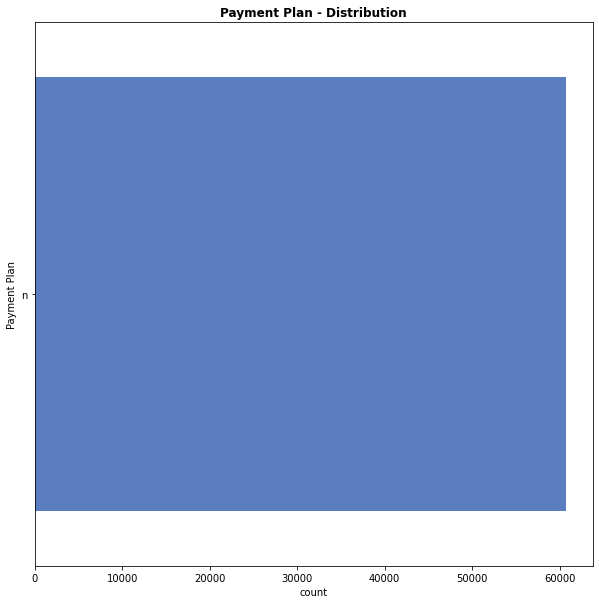

In [81]:
# dropping the column
plot_feature_categorical('Payment Plan')
df.drop(['Payment Plan'], inplace=True, axis=1)
X_test.drop(['Payment Plan'], inplace=True, axis=1)

### **7. Loan Title**

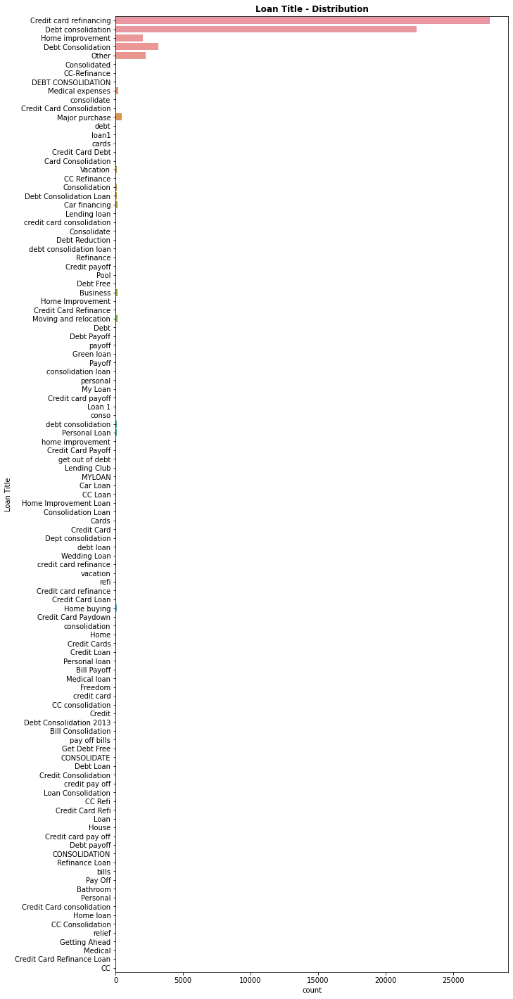

In [82]:
figure,ax = plt.subplots(figsize=(10,25))
sns.set_palette("muted")
sns.countplot(y=df['Loan Title']).set_title('{} - Distribution'.format('Loan Title'),fontweight='bold')
plt.show()

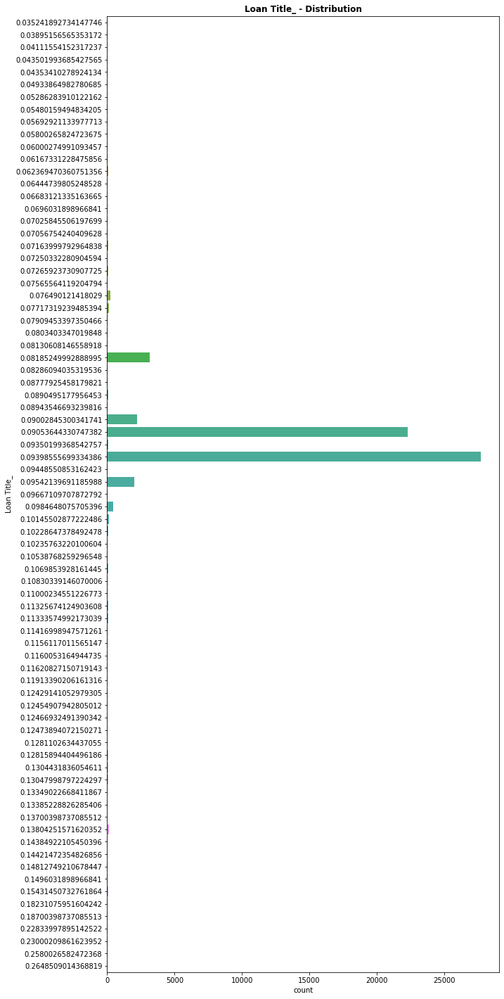

In [83]:
WEIGHT = 8
df.loc[:,['Loan Title_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Loan Title', target='Loan Status', weight=WEIGHT)
figure,ax = plt.subplots(figsize=(10,25))
sns.set_palette("muted")
sns.countplot(y=df['Loan Title_']).set_title('{} - Distribution'.format('Loan Title_'),fontweight='bold')
plt.show()
df.drop(['Loan Title'],axis=1,inplace=True)

X_test.loc[:,['Loan Title_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Loan Title', target='Loan Status', weight=WEIGHT)
X_test.drop(['Loan Title'],axis=1,inplace=True)

### **8. Initial List Status**

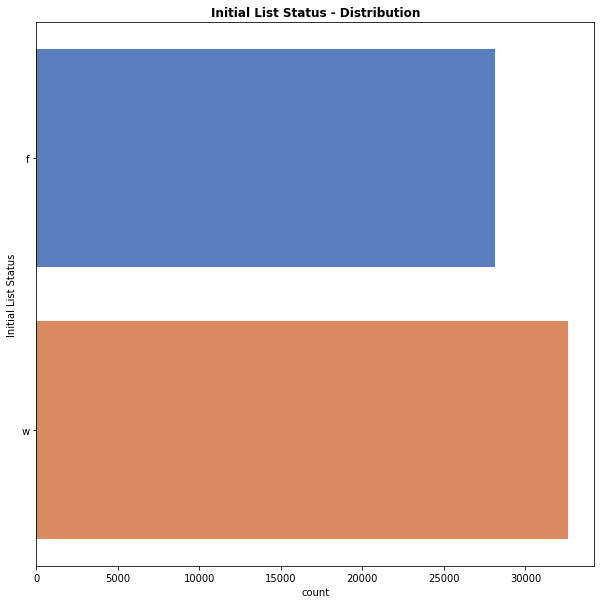

In [84]:
plot_feature_categorical('Initial List Status')

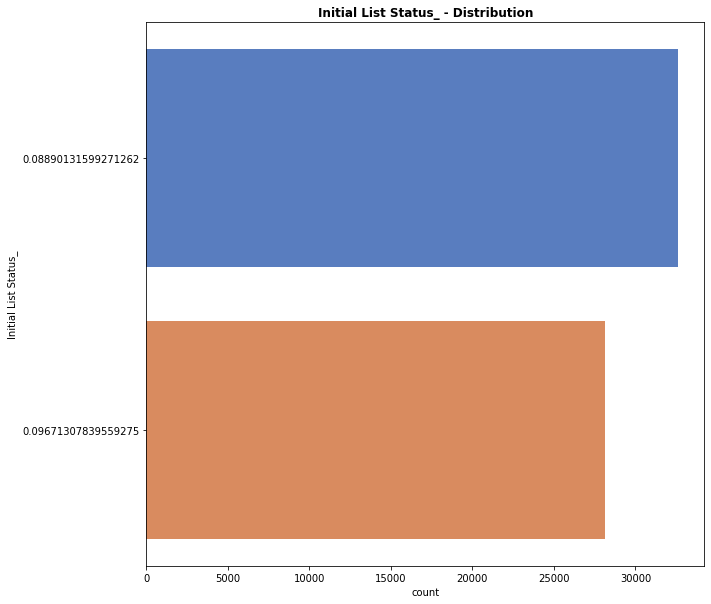

In [85]:
WEIGHT = 8
df.loc[:,['Initial List Status_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Initial List Status', target='Loan Status', weight=WEIGHT)
plot_feature_categorical('Initial List Status_')
df.drop(['Initial List Status'],axis=1,inplace=True)

X_test.loc[:,['Initial List Status_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Initial List Status', target='Loan Status', weight=WEIGHT)
X_test.drop(['Initial List Status'],axis=1,inplace=True)

### **9. Application Type**

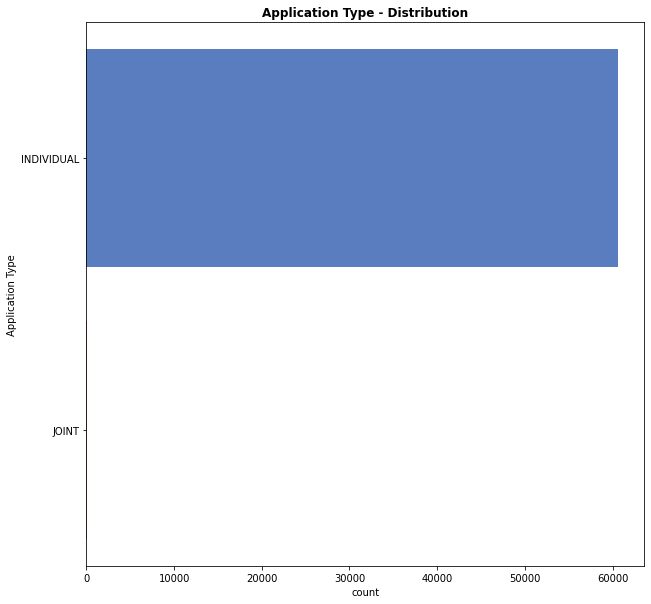

In [86]:
plot_feature_categorical('Application Type')

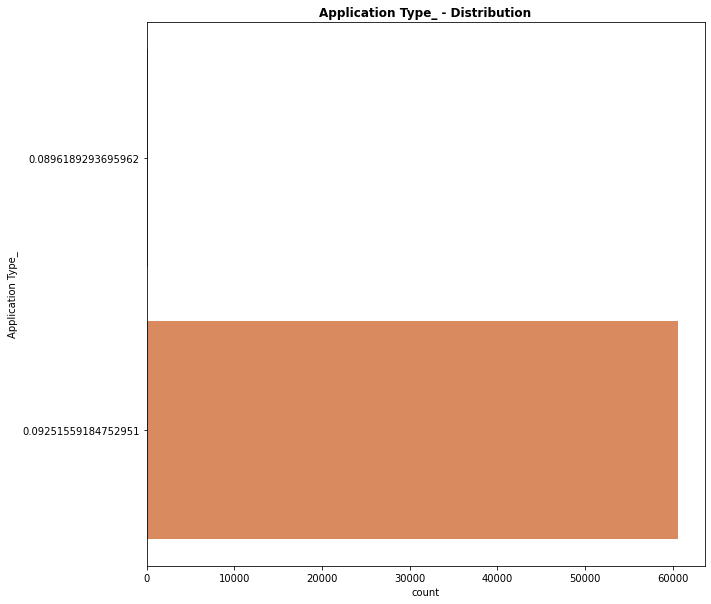

In [87]:
WEIGHT = 8
df.loc[:,['Application Type_']] = calc_smooth_mean(df1=df, df2=None, cat_name='Application Type', target='Loan Status', weight=WEIGHT)
plot_feature_categorical('Application Type_')
df.drop(['Application Type'],axis=1,inplace=True)

X_test.loc[:,['Application Type_']] = calc_smooth_mean(df1=df_testdata, df2=None, cat_name='Application Type', target='Loan Status', weight=WEIGHT)
X_test.drop(['Application Type'],axis=1,inplace=True)

## **Correlations in Data**

Text(0.5, 1.0, 'Feature Correlation')

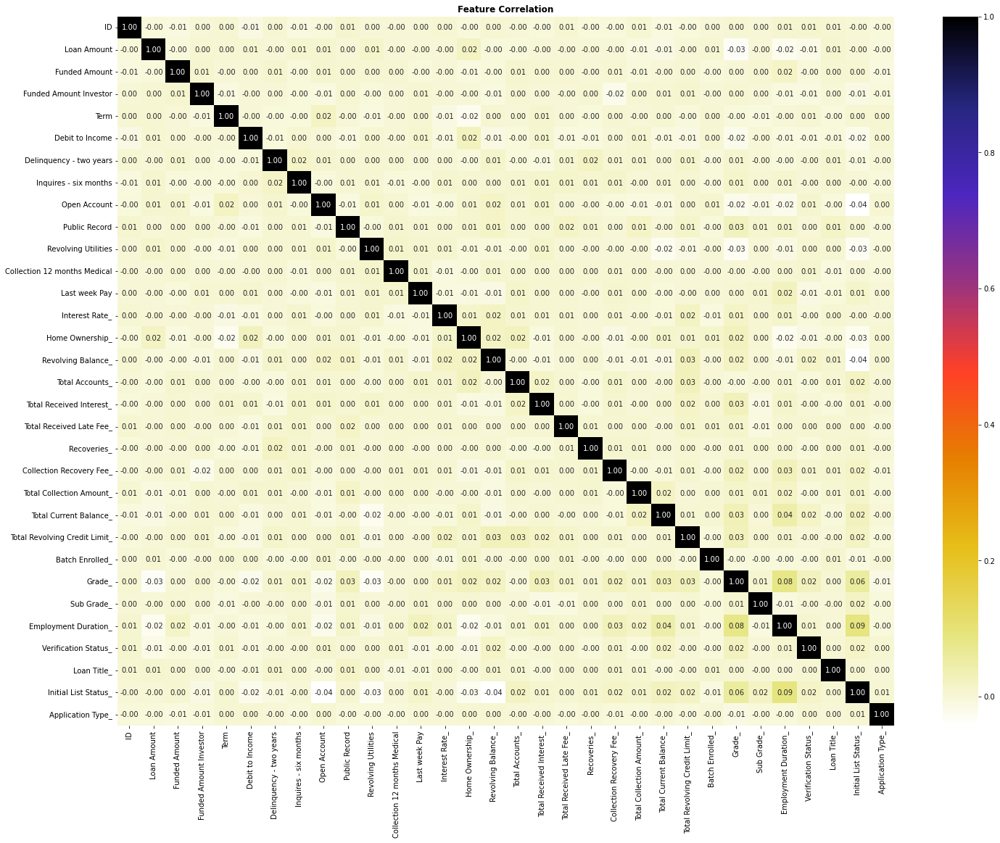

In [88]:
plt.subplots(1,1,figsize=(24, 18))
sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap="CMRmap_r")
plt.title("Feature Correlation", fontweight='bold')

Not much correlation seen. So we can move forward with feature engineering

# **Feature Engineering**

### **For train data**

In [89]:
df['category'] = 0
X_test['category'] = 1

In [90]:
master_data = pd.concat([df,X_test])
master_data

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Utilities,Collection 12 months Medical,Last week Pay,Interest Rate_,Home Ownership_,Revolving Balance_,Total Accounts_,Total Received Interest_,Total Received Late Fee_,Recoveries_,Collection Recovery Fee_,Total Collection Amount_,Total Current Balance_,Total Revolving Credit Limit_,Batch Enrolled_,Grade_,Sub Grade_,Employment Duration_,Verification Status_,Loan Title_,Initial List Status_,Application Type_,category
19303,45923819,21497,8173,9554.691683,58,14.922408,0,0,9,0,83.972847,0,24,2.276309,11.242987,19.242506,1.386294,7.367205,0.342310,2.100461,0.533895,2.884499,10.512356,10.146395,0.094442,0.091249,0.089345,0.088664,0.092116,0.093986,0.096713,0.092516,0
18659,2075401,15123,7324,9425.109627,59,26.059738,0,0,14,0,24.065929,0,76,2.652139,11.308474,17.513731,1.791759,7.747543,0.384730,0.934700,0.429765,3.361975,13.089964,10.401714,0.086592,0.103700,0.099843,0.088664,0.091272,0.093986,0.088901,0.092516,0
228,22688037,16630,6766,21229.668480,59,22.673639,0,0,8,0,40.448391,0,90,3.140154,11.535461,17.494148,3.258097,7.819223,0.449500,1.841606,0.483407,2.223980,12.024035,8.395026,0.093737,0.087239,0.099843,0.095693,0.093383,0.090536,0.096713,0.092516,0
42018,34809188,12786,13956,13405.624740,59,15.774540,0,0,18,0,21.386740,0,91,1.795207,11.336519,18.203453,2.564949,7.207852,0.407974,1.802648,1.094860,3.391211,12.702015,7.896925,0.092276,0.096376,0.095650,0.101541,0.093383,0.095421,0.096713,0.092516,0
10207,50360069,17770,12167,4998.892707,59,14.210585,0,0,10,0,83.654772,0,67,2.416876,11.699572,25.017588,1.945910,7.097997,0.284486,1.628063,1.225885,3.072317,11.310736,10.155413,0.099436,0.091249,0.099843,0.088664,0.093383,0.090536,0.088901,0.092516,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2494,52003330,2319,12605,9921.789651,59,9.000117,0,0,10,0,57.412987,0,69,2.325884,10.825635,23.770969,2.302585,8.393127,0.335457,1.323638,0.421692,3.634241,13.205306,9.112728,0.093764,0.093895,0.094064,0.101541,0.093383,0.090536,0.088901,0.092516,1
36173,16590583,15841,13480,11188.965230,58,11.274347,0,0,16,1,81.303511,0,57,2.723600,11.009126,17.619589,2.639057,7.081788,0.348743,1.963692,0.630043,3.361975,11.210008,9.789927,0.093764,0.096376,0.100873,0.095693,0.092116,0.093986,0.096713,0.092516,1
44674,4438003,19414,6378,16831.526370,59,26.549147,0,2,10,0,94.035106,0,65,2.019775,11.125996,31.208788,2.484907,9.116345,0.370343,1.390902,1.090424,9.771485,10.591522,11.698724,0.094366,0.087239,0.103439,0.088664,0.093383,0.093986,0.088901,0.092516,1
58289,60918809,19963,9610,21104.543670,59,26.870278,0,0,13,0,41.475951,0,90,2.669763,11.635098,25.932765,2.944439,7.386155,0.435979,1.438465,0.622651,3.556893,10.590742,10.167159,0.093764,0.093895,0.128898,0.088664,0.093383,0.093986,0.096713,0.092516,1


In [91]:
!pip install featuretools

     |████████████████████████████████| 339 kB 11.9 MB/s 
     |████████████████████████████████| 1.1 MB 47.8 MB/s 
     |████████████████████████████████| 15.7 MB 38.3 MB/s 
     |████████████████████████████████| 160 kB 50.5 MB/s 
     |████████████████████████████████| 830 kB 45.0 MB/s 
     |████████████████████████████████| 280 kB 50.0 MB/s 
     |████████████████████████████████| 596 kB 49.1 MB/s 
     |████████████████████████████████| 133 kB 52.9 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Attempting uninstall: cloudpickle
    Found existing installation: cloudpickle 1.3.0
    Uninstalling cloudpickle-1.3.0:
      Successfully uninstalled cloudpickle-1.3.0
  Attempting uninstall: psutil
    Found existing installation:

In [92]:
#https://towardsdatascience.com/automated-feature-engineering-in-python-99baf11cc219
#https://www.kaggle.com/willkoehrsen/automated-feature-engineering-tutorial

import featuretools as ft
es = ft.EntitySet(id = 'Defaulters')
es = es.add_dataframe(dataframe_name='master_data',dataframe=master_data,index="ID")
feature_matrix, feature_names = ft.dfs(entityset=es, target_dataframe_name='master_data',max_depth=2, verbose=3, n_jobs=1,trans_primitives=['divide_numeric'])


/usr/local/lib/python3.7/dist-packages/featuretools/synthesis/deep_feature_synthesis.py:156: UserWarning: Only one dataframe in entityset, changing max_depth to 1 since deeper features cannot be created
  warnings.warn("Only one dataframe in entityset, changing max_depth to "


Built 1024 features
Elapsed: 00:00 | Progress:  91%|█████████ 

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4486: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  data[k] = com.apply_if_callable(v, data)


Elapsed: 00:05 | Progress: 100%|██████████


In [93]:
# null values in feature_matrix
feature_matrix.fillna(0,inplace=True)
print(sum(feature_matrix.isna().any()))

#drop infinite values
col = feature_matrix.columns.to_series()
boolean_col = np.isinf(feature_matrix).any()
useless_col = col[boolean_col]
useless_col_list = list(useless_col)
feature_matrix.drop(useless_col_list,inplace=True,axis=1)

#check
print(sum(np.isinf(feature_matrix).any()))

0
0


In [94]:
x_train_data = feature_matrix.groupby('category').get_group(0)
x_test_data = feature_matrix.groupby('category').get_group(1)

In [95]:
x_train_data.reset_index(drop=True, inplace=True)
x_test_data.reset_index(drop=True, inplace = True)

In [96]:
x_test_data.shape

(6747, 809)

In [97]:
y_train_data = df_y.copy()
y_test_data = y_test.copy()
y_test_data.shape

(6747, 1)

# **Final Train Test Data**
### 1. Train - x_train_data,y_train_data (Oversampled Data - x_train_balanced , y_train_balanced)
### 2. Test - x_test_data,y_test_data

## **OverSampling - SMOTE - Not used, to avoid overfitting**

In [98]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE(random_state= 0)
x_train_balanced, y_train_balanced = oversample.fit_resample(x_train_data, y_train_data)
x_train_balanced=pd.DataFrame(x_train_balanced)

In [99]:
y_train_balanced.value_counts()

Loan Status
0              55099
1              55099
dtype: int64

# **Scaling**

In [208]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled_data = pd.DataFrame(scaler.fit_transform(x_train_data))
x_train_scaled_data.columns = x_train_data.columns
x_test_scaled_data = pd.DataFrame(scaler.transform(x_test_data))
x_test_scaled_data.columns = x_test_data.columns


In [209]:
x_train_scaled_data.shape

(60716, 809)

# **ANN**

In [103]:
!pip install tensorflow-addons

In [4]:
import tensorflow as tf
import tensorflow_addons as tfa

In [149]:
from keras import regularizers
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras.layers import Dense,Dropout,BatchNormalization
from tensorflow.keras.models import Sequential
from keras.callbacks import History 
from sklearn.metrics import roc_auc_score,log_loss,f1_score,confusion_matrix
from tensorflow.keras.metrics import BinaryCrossentropy
from keras.callbacks import EarlyStopping


In [221]:
# tensor-board in colab
# Refer: https://www.tensorflow.org/tensorboard/get_started
import os
import datetime

! rm -rf ./logs/ 
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
print(logdir)


logs/20220206-130337


In [222]:
# define model
model = Sequential()
history = History()
# define first hidden layer and visible layer

model.add(Dense(512, input_dim=809, activation='relu', kernel_initializer='he_uniform',kernel_regularizer=regularizers.l1(0.0001)))
#model.add(Dropout(0.20))
model.add(Dense(256, activation = 'relu', kernel_initializer = 'he_uniform',kernel_regularizer=regularizers.l1(0.0001)))
model.add(Dropout(0.20))
model.add(Dense(128, activation = 'relu', kernel_initializer = 'he_uniform', kernel_regularizer=regularizers.l1(0.0001)))
#model.add(Dropout(0.20))
model.add(BatchNormalization())
model.add(Dense(64, activation = 'relu', kernel_initializer = 'he_uniform', kernel_regularizer=regularizers.l1(0.0001)))
model.add(BatchNormalization())
# define output layer
model.add(Dense(1, activation='sigmoid'))
# define loss and optimizer
opt = keras.optimizers.Adam(learning_rate=0.00005) #tfa.losses.SigmoidFocalCrossEntropy(reduction=tf.keras.losses.Reduction.AUTO)
model.compile(loss='binary_crossentropy', optimizer=opt)


In [196]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               414720    
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dense_3 (Dense)             (None, 64)                8256      
                                                                 
 batch_normalization_1 (Batc  (None, 64)               256       
 hNormalization)                                        

In [177]:
weights_assigned={0:0.56,1:5}
#class_weight = weights_assigned

In [223]:
# tensor-board in colab
%load_ext tensorboard
%tensorboard --logdir $logdir

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [218]:
tf.keras.backend.clear_session()

In [224]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
ann = model.fit(x_train_scaled_data,y_train_data,epochs=200,verbose=1, validation_data=(x_test_scaled_data, y_test_data), #class_weight = weights_assigned,
               callbacks = [EarlyStopping(monitor='val_loss', patience=15), tensorboard_callback]) #EarlyStopping(monitor='val_loss', patience=10),

Epoch 1/200
1898/1898 [==============================] - 14s 7ms/step - loss: 3.3519 - val_loss: 3.1094
Epoch 2/200
1898/1898 [==============================] - 12s 6ms/step - loss: 2.9709 - val_loss: 2.8357
Epoch 3/200
1898/1898 [==============================] - 12s 6ms/step - loss: 2.7373 - val_loss: 2.6372
Epoch 4/200
1898/1898 [==============================] - 12s 6ms/step - loss: 2.5416 - val_loss: 2.4478
Epoch 5/200
1898/1898 [==============================] - 12s 6ms/step - loss: 2.3495 - val_loss: 2.2566
Epoch 6/200
1898/1898 [==============================] - 12s 6ms/step - loss: 2.1601 - val_loss: 2.0747
Epoch 7/200
1898/1898 [==============================] - 12s 6ms/step - loss: 1.9823 - val_loss: 1.9030
Epoch 8/200
1898/1898 [==============================] - 12s 6ms/step - loss: 1.8158 - val_loss: 1.7419
Epoch 9/200
1898/1898 [==============================] - 12s 6ms/step - loss: 1.6596 - val_loss: 1.5990
Epoch 10/200
1898/1898 [==============================] - 12s 6m

In [229]:
from sklearn.metrics import roc_auc_score,log_loss,f1_score,confusion_matrix
yte=model.predict(x_test_scaled_data)
#yte_pred =np.argmax(yte,axis=1)
ytr = model.predict(x_train_scaled_data)
#ytr_pred =np.argmax(ytr,axis=1)
print('test logloss',log_loss(y_test_data,yte))
print('train logloss',log_loss(y_train_data,ytr))


test logloss 0.333532027829916
train logloss 0.25950487872832
